<a href="https://colab.research.google.com/github/chpham92/chpham92/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification
This notebook builds an end-toend multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed on the dog,given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this makes (this means there are 120 different classes)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set (these images have no lbaels, because we'll want to predict them)


In [ ]:
# Import TensorFlow into Colab
# Import TensorFlow Hub
# Make sure we're using a GPU
import tensorflow as tf
print("TF version", tf.__version__)

TF version 2.19.0


In [ ]:
# Import necesssary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print("Hub version", hub.__version__)

# Check for GPU availibility
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version 2.19.0
Hub version 0.16.1
GPU available


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations). Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

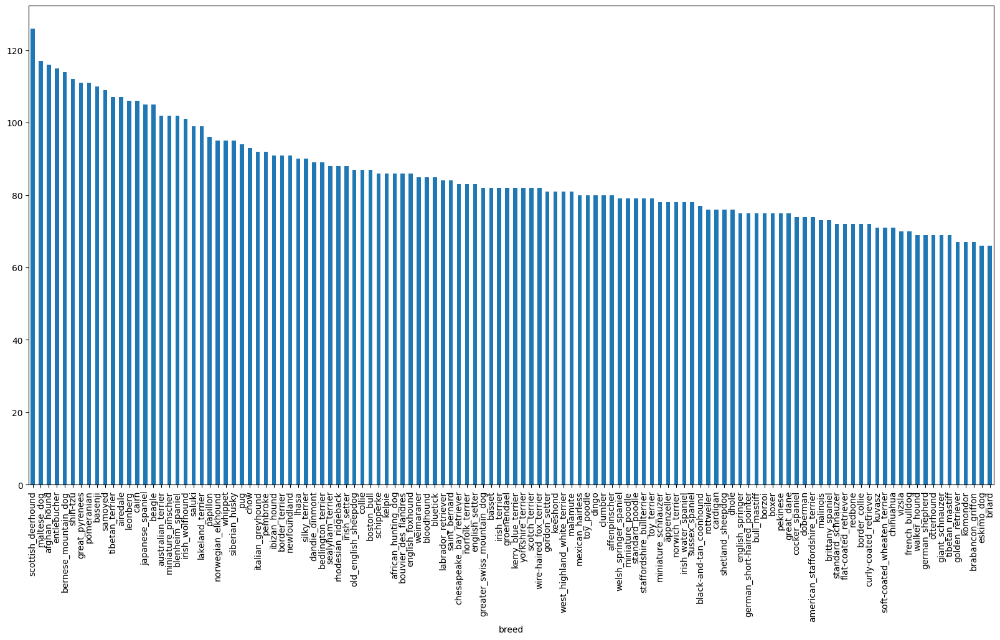

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

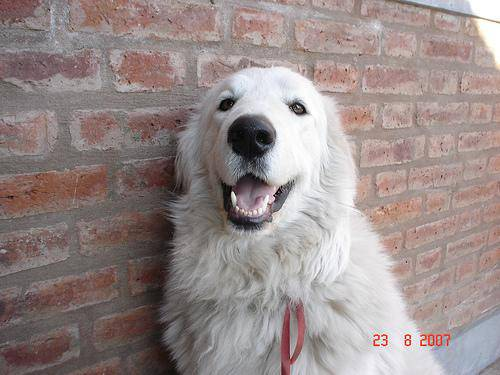

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/0a0c223352985ec154fd604d7ddceabd.jpg")

### Getting images and their labels
let's get a list of all of our image file pathnames

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg"  for fname in labels_csv["id"]]

# Check the first ID
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames do not match actual amount of files, check the target directory")

Filenames match actual amount of files


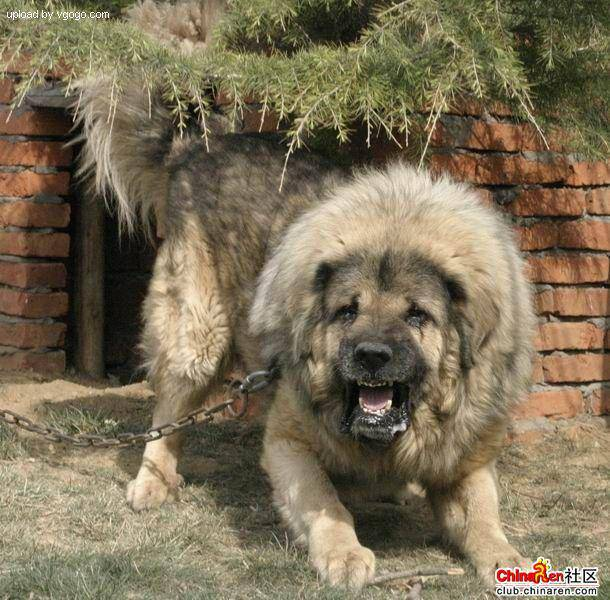

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[2]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

# Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experiamenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@ param {type:"slider", min:1000, max:10000, step:1000}


In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the 'image' to be a shape of (224, 224)
6. Return the modified 'image'

In [ ]:
# Convert an image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image sizes
IMAGE_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensors with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 224)
  image = tf.image.resize(image, size=[IMAGE_SIZE, IMAGE_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go.. they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be)

In order to use TensorFlow effectgively , we need our data in the form of Tensor tuples which look like this (image, label)

In [ ]:
# Create a simple feature to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now weve got a way to turn our data into tuples of Tensors in the form: (image, label), let's make a function to turn all of our data (X & y) into batches

In [ ]:
# Define teh batch size (32 is a good start)
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating trtaining data batches...")
    # turning filepaths and labels into Tansors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating trtaining data batches...
Creating validation data batches...


In [ ]:
# Check out teh different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

A data is now in batches, however these can be a bit ahrd to understand/comprehend. let's visualize them

In [ ]:
import matplotlib.pyplot as plt
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Set up the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    # Dipslay an inage
    plt.imshow(images[i])
    # Turn the grid lines off & Add the image label as the title
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])

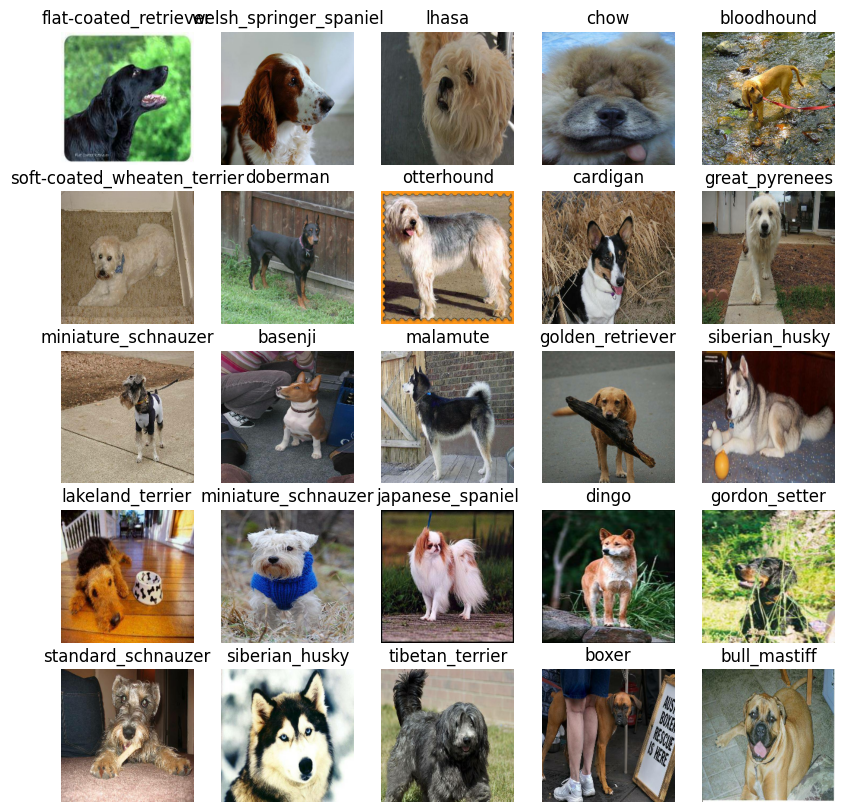

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

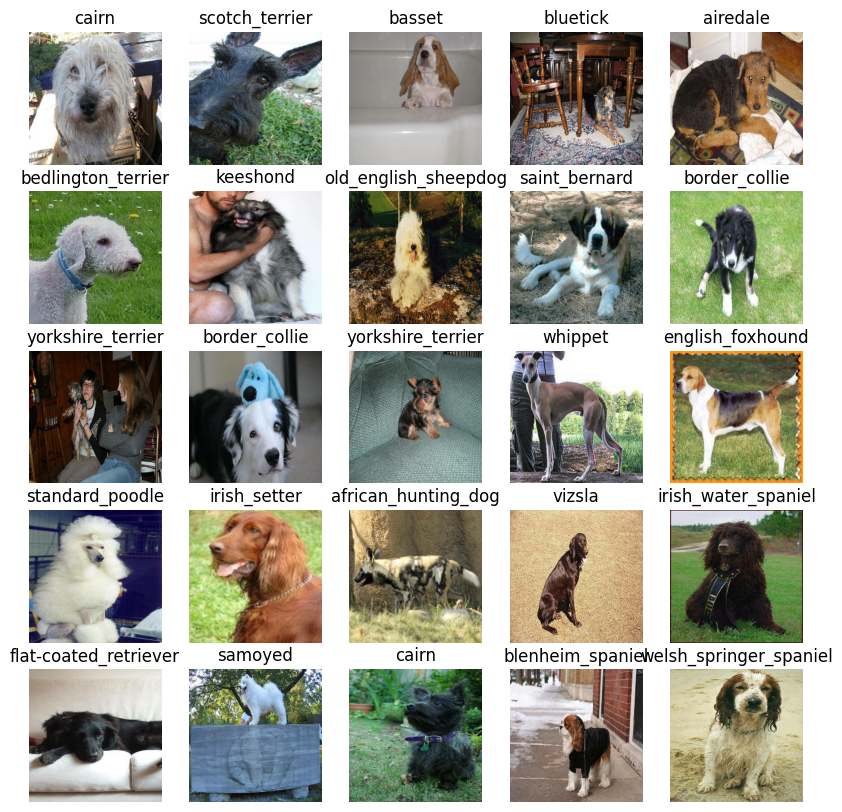

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output (image labels, in the form of Tensors) of our mode.
* The URL of the model we want to use.

In [ ]:
# Setup input shpae to the model
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs, and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a fuction which:
* Takes the input shape, output shape, and the model we've chose as parameters
* Define the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting
* Return the model

All of these steps can be found here https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
import tf_keras as keras
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (inout)
      keras.layers.Dense(OUTPUT_SHAPE, activation="softmax") # Layer 2 (output)
  ])


  # Compile the model


  # Complie the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback
To setup a TensorBoard callback, we need to do three things:
1. Load the TensorBoard note extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our mdoel's fit() function
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training)

In [ ]:
# load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks.EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                               patience=3)

# Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, steps:10)}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model

* Create a nodel using "create_model"
* Setup a TensorBoard callback using "create_tensorboard_callback()"
* Call the fit() function on our model passing ti the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session every time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model



In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 146s 6s/step - loss: 4.5682 - accuracy: 0.1063 - val_loss: 3.5012 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 4s 157ms/step - loss: 1.6435 - accuracy: 0.6625 - val_loss: 2.2083 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 4s 178ms/step - loss: 0.5725 - accuracy: 0.9388 - val_loss: 1.7532 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 5s 182ms/step - loss: 0.2554 - accuracy: 0.9837 - val_loss: 1.5955 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1511 - accuracy: 0.9975 - val_loss: 1.4886 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 4s 163ms/step - loss: 0.1023 - accuracy: 0.9987 - val_loss: 1.4411 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================]

***Question*** its looks like our model is overfitting because it's performing far better on the training dataset than the validatiob dataset, what are some ways to prevent model overfitting in deep learning neural networks?

***Note*** Overfitting to begin with is a good thing! It emans our model is learning!

### Checking the TensorBoard log

The TensorBoard magic function ("%tensorboard") will access the logs directory we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long each epoch takes
predictions

7/7 [==============================] - 2s 155ms/step


array([[1.98185793e-03, 3.43406791e-05, 2.36770767e-03, ...,
        4.97914843e-05, 4.94775304e-06, 2.22101784e-03],
       [1.26123382e-03, 4.35282738e-04, 5.93876559e-03, ...,
        4.51156142e-04, 3.46764247e-03, 1.72673404e-04],
       [9.67304572e-07, 2.24559379e-04, 1.98185699e-05, ...,
        1.73454726e-04, 1.45148151e-04, 7.09760410e-04],
       ...,
       [7.93749059e-05, 5.31759986e-04, 9.25351342e-05, ...,
        1.73365785e-04, 1.83330383e-04, 1.49283689e-04],
       [3.52822128e-03, 1.20553814e-04, 6.10095049e-05, ...,
        1.06566375e-04, 3.77551769e-05, 1.19993109e-02],
       [2.21359823e-03, 1.26787912e-04, 1.72633782e-03, ...,
        8.89148097e-03, 5.15992637e-04, 2.74825579e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.73675420e-04 8.44815149e-05 4.72671527e-05 2.96795388e-05
 1.59492798e-03 8.92162134e-05 7.96833046e-05 1.16307905e-03
 8.01945478e-03 3.46940868e-02 2.93417070e-05 4.40497433e-06
 1.45697530e-04 5.17587271e-03 1.55616482e-03 3.42081813e-03
 4.54648325e-05 3.00457061e-04 4.38776333e-04 2.76566570e-04
 5.72490862e-05 9.27633373e-04 2.53726030e-04 4.76340138e-05
 1.33769503e-02 2.34621966e-05 2.14650499e-05 1.34456408e-04
 5.27640979e-04 6.11684154e-05 1.71008996e-05 1.68205050e-04
 8.52131561e-05 4.26977967e-05 3.19167448e-05 8.76320337e-06
 1.30924789e-04 1.06444866e-04 3.49353431e-05 1.86419785e-01
 2.67559109e-04 2.34276758e-05 1.45708444e-03 5.57103840e-06
 3.42890009e-04 4.65607591e-05 3.30832001e-04 1.01698148e-04
 2.78218231e-05 5.90674696e-04 5.59967702e-05 4.03193699e-04
 2.73515267e-04 9.78690921e-04 2.18418281e-05 2.40399691e-04
 4.03415004e-04 3.38899408e-04 4.13877540e-04 1.18098269e-05
 1.32955989e-04 5.93411329e-04 3.36271514e-05 3.19400096e-05
 3.07896640e-04 8.567436

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective labels. Easier to uderstand
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[62])
pred_label

'afghan_hound'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since our validation data is still in a btach dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got a way to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual

We'll create a function which:
* Takes an array of prediction probabilites, an array of truth labels and an array of images an integers.
* Convert the predicting probabilities to a predicted lbael.
* Plot the predicted label, its predicted probability, the truth laebl and the target image of a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth, and image for sample n
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Plot images & remove ticks


    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on the prediction if it is right or wrong
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    # Change plot title to be predicted, probability of prediction, and truth label
    plt.title("{} {:0.2f}% {}".format(pred_label, np.max(pred_prob) * 100, true_label), color=color)

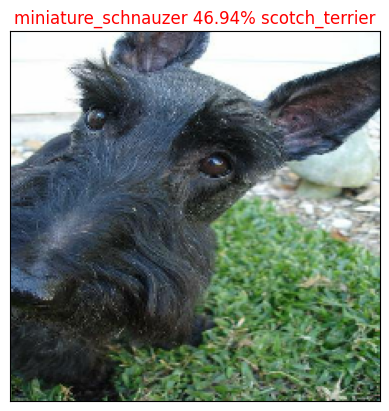

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

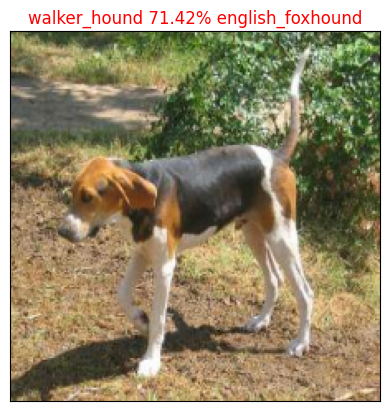

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Now we've got one function to visualize our models top perdiction, let's make another to view our top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the predictive label using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities idex
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1, figsize=(10, 14)):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")
  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

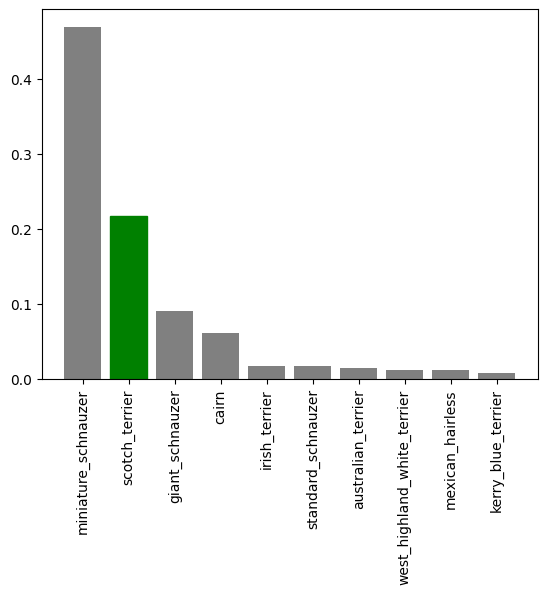

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few

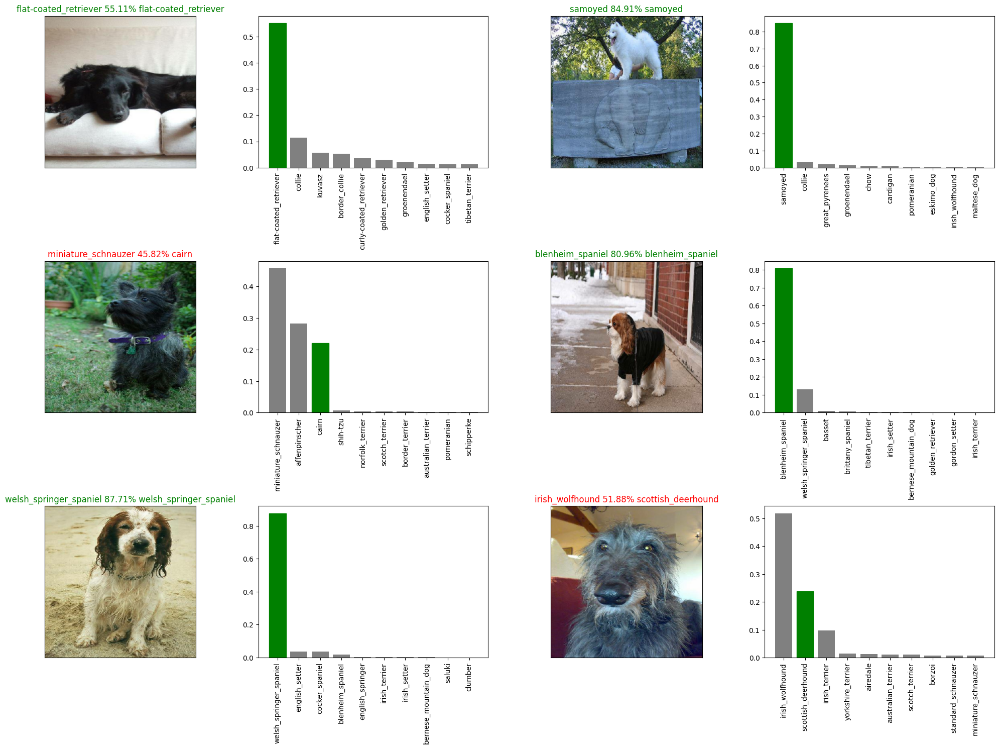

In [ ]:
# let's check out a few preedictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge** How would you create a confusion matrix with our models predictions and true labels?

Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")


Saving model to: drive/My Drive/Dog Vision/models/20251014-03311760412705-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20251014-03311760412705-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20251014-03291760412570-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20251014-03291760412570-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 199ms/step - loss: 1.3060 - accuracy: 0.6300


[1.3059691190719604, 0.6299999952316284]

In [ ]:
# Evaluate the laoded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 138ms/step - loss: 1.3060 - accuracy: 0.6300


[1.3059691190719604, 0.6299999952316284]

## Training a big dog model (on the full data)

In [ ]:
## Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating trtaining data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training all of the data, so we can't monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy",
                                                          patience=3)

Running the cell below will take a while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images in memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 59s 167ms/step - loss: 1.3413 - accuracy: 0.6680
Epoch 2/100
320/320 [==============================] - 50s 155ms/step - loss: 0.4068 - accuracy: 0.8788
Epoch 3/100
320/320 [==============================] - 44s 138ms/step - loss: 0.2366 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 45s 141ms/step - loss: 0.1536 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 45s 139ms/step - loss: 0.1082 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0775 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0581 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 43s 135ms/step - loss: 0.0459 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0365 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 44s 137m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20251014-04061760414800-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20251014-04061760414800-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20251014-04061760414800-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20251014-04061760414800-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the testdata, we'll have to get it into the same format

Luckily we created 'create_data_batches()' earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
  * Get the test imade filenames
  * Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels)
  * Make a predictions array by passing the test batches to the predict() method called on our model

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e2844bf76c0ddeae02277d76c31e41f5.jpg',
 'drive/My Drive/Dog Vision/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 'drive/My Drive/Dog Vision/test/df2ce797bf398414aac7e20119c17cb6.jpg',
 'drive/My Drive/Dog Vision/test/dda9df5ec2de82082127c99052fd077b.jpg',
 'drive/My Drive/Dog Vision/test/e70dfb4bf50f74850463cfd35edc8af5.jpg',
 'drive/My Drive/Dog Vision/test/e596c0d97b381e876d46dda2eb60074c.jpg',
 'drive/My Drive/Dog Vision/test/e644a1f6f9c69ee8f7e8d834730bbfd7.jpg',
 'drive/My Drive/Dog Vision/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 'drive/My Drive/Dog Vision/test/eca94e609a77c2ed87b79c3c08a11a62.jpg',
 'drive/My Drive/Dog Vision/test/f0138bdbeba02c23bef5eebd81fcf3ec.jpg']

In [ ]:
len(test_filenames)

10371

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

325/325 [==============================] - 1908s 6s/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

## Prepaing the test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that is wants our models prediction probability outputs in a DataFrame with an ID and a column for each dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepath
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle

In [ ]:
# Create a pandas DataFrane with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# Append test image ID's to predictions DaaFrane
test_ids = [os.path.splitext(path[0]) for path in os.listdir(test_path)]
test_ids[:10]
preds_df["id"] = test_ids
preds_df.head()

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions DataFrame to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_prediction_submission_1_mobilenetV2.csv", index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the filepaths into data batches using 'create_data_batches()'. And since our custom images won't have labels, we set the test_data parameter to True
* Convert the prediction output probabilites to predictions labels
* Compare the predicted labels to the custom images

In [ ]:
# Get custom image filepath
# custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
# custom_image_paths = [custom_path + "/" + fname for fname in os.listdir(custom_path)]

# Turn custom images into batch datasets
# custom_data = create_data_batches(custom_image_paths, test_data=True)
# custom_data

# Make predictions on the custom data
# custom_preds = loaded_full_model.predict(custom_data)
# custom_preds.shape

# Get custom image prediction labels
# custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
# custom_pred_labels

# Get custom images (our unbatchify() function won't work since there aren't labels..)
# custom_images = []

# Loop through unbatched data
# for image in custom_data.unbatch().as_numpy_iterator():
#  custom_images.append(image)

# Check custom image predictions
#plt.figure(figsize=(10, 10))
# for i in enumerate(custom_images):
#  plt.subplot(1, 3, i[0]+1)
#  plt.xticks([])
#  plt.yticks([])
#  plt.title(custom_pred_labels[i])
#  plt.imshow(image)


